In [1]:
import geopandas as gpd
import pandas as pd
import folium
import geojson as gjs

In [2]:
from shapely import Point, LineString, Polygon

In [3]:
import matplotlib.pyplot as plt

# Read the shapefile
data = gpd.read_file('world-administrative-boundaries.shp')


In [4]:
data.head()

,iso3,status,color_code,name,continent,region,iso_3166_1_,french_shor,geometry
0,NaN,Adm. by EGY,EGY,Ma'tan al-Sarra,Africa,Northern Africa,NaN,Ma'tan al-Sarra,"POLYGON ((33.25104 21.99977, 34.15064 21.99603..."
1,CHE,Member State,CHE,Switzerland,Europe,Western Europe,CH,Suisse,"POLYGON ((9.56672 47.54045, 9.55980 47.50209, ..."
2,NaN,UK Territory,GBR,Jersey,Europe,Northern Europe,NaN,Jersey,"POLYGON ((-2.01500 49.21417, -2.02111 49.17721..."
3,AUT,Member State,AUT,Austria,Europe,Western Europe,AT,Autriche,"POLYGON ((16.94618 48.61907, 16.94333 48.57333..."
4,PRT,Member State,PRT,Portugal,Europe,Southern Europe,PT,Portugal,"POLYGON ((-7.43185 37.25319, -7.41903 37.18055..."


In [5]:
fig,ax = plt.subplots(figsize=(200,200))
data.plot(ax=ax,facecolor='none',linewidth=2, edgecolor='black')
plt.show()

In [6]:
unique_values = data[['color_code', 'name']].drop_duplicates()
unique_values_sorted = unique_values.sort_values(by=['color_code', 'name'])
unique_dict = dict(zip(unique_values_sorted['color_code'], unique_values_sorted['name']))

print(unique_dict)

{'ABW': 'Aruba', 'AFG': 'Afghanistan', 'AGO': 'Angola', 'AIA': 'Anguilla', 'ALB': 'Albania', 'AND': 'Andorra', 'ARE': 'United Arab Emirates', 'ARG': 'Argentina', 'ARM': 'Armenia', 'ASM': 'American Samoa', 'ATG': 'Antigua & Barbuda', 'AUS': 'Norfolk Island', 'AUT': 'Austria', 'AZE': 'Azerbaijan', 'BDI': 'Burundi', 'BEL': 'Belgium', 'BEN': 'Benin', 'BFA': 'Burkina Faso', 'BGD': 'Bangladesh', 'BGR': 'Bulgaria', 'BHR': 'Bahrain', 'BHS': 'Bahamas', 'BIH': 'Bosnia & Herzegovina', 'BLR': 'Belarus', 'BLZ': 'Belize', 'BMU': 'Bermuda', 'BOL': 'Bolivia', 'BRA': 'Brazil', 'BRB': 'Barbados', 'BRN': 'Brunei Darussalam', 'BTN': 'Bhutan', 'BWA': 'Botswana', 'CAF': 'Central African Republic', 'CAN': 'Canada', 'CHE': 'Switzerland', 'CHL': 'Chile', 'CHN': 'Taiwan', 'CIV': "Côte d'Ivoire", 'CMR': 'Cameroon', 'COD': 'Democratic Republic of the Congo', 'COG': 'Congo', 'COL': 'Colombia', 'COM': 'Comoros', 'CPV': 'Cape Verde', 'CRI': 'Costa Rica', 'CUB': 'Cuba', 'CYP': 'Cyprus', 'CZE': 'Czech Republic', 'DEU'

In [7]:
import pandas as pd
import json

# Step 1: Read the JSON file to extract category_id and category title mappings
with open('IN_category_id.json', 'r') as json_file:
    category_data_IN = json.load(json_file)['items']

# Create a dictionary to map category_id to category title
category_mapping_IN = {int(item['id']): item['snippet']['title'] for item in category_data_IN}

# Step 2: Read the CSV file and add a new column for category title
df_IN = pd.read_csv('INvideos.csv')

# Map category_id to category title and add a new column
df_IN['category_title'] = df_IN['category_id'].map(category_mapping_IN)


In [8]:
category_mapping_IN

{1: 'Film & Animation',
 2: 'Autos & Vehicles',
 10: 'Music',
 15: 'Pets & Animals',
 17: 'Sports',
 18: 'Short Movies',
 19: 'Travel & Events',
 20: 'Gaming',
 21: 'Videoblogging',
 22: 'People & Blogs',
 23: 'Comedy',
 24: 'Entertainment',
 25: 'News & Politics',
 26: 'Howto & Style',
 27: 'Education',
 28: 'Science & Technology',
 30: 'Movies',
 31: 'Anime/Animation',
 32: 'Action/Adventure',
 33: 'Classics',
 34: 'Comedy',
 35: 'Documentary',
 36: 'Drama',
 37: 'Family',
 38: 'Foreign',
 39: 'Horror',
 40: 'Sci-Fi/Fantasy',
 41: 'Thriller',
 42: 'Shorts',
 43: 'Shows',
 44: 'Trailers'}

In [9]:
df_IN.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title
0,kzwfHumJyYc,17.14.11,Sharry Mann: Cute Munda ( Song Teaser) | Parmi...,Lokdhun Punjabi,1,2017-11-12T12:20:39.000Z,"sharry mann|""sharry mann new song""|""sharry man...",1096327,33966,798,882,https://i.ytimg.com/vi/kzwfHumJyYc/default.jpg,False,False,False,Presenting Sharry Mann latest Punjabi Song Cu...,Film & Animation
1,zUZ1z7FwLc8,17.14.11,"पीरियड्स के समय, पेट पर पति करता ऐसा, देखकर दं...",HJ NEWS,25,2017-11-13T05:43:56.000Z,"पीरियड्स के समय|""पेट पर पति करता ऐसा""|""देखकर द...",590101,735,904,0,https://i.ytimg.com/vi/zUZ1z7FwLc8/default.jpg,True,False,False,"पीरियड्स के समय, पेट पर पति करता ऐसा, देखकर दं...",News & Politics
2,10L1hZ9qa58,17.14.11,Stylish Star Allu Arjun @ ChaySam Wedding Rece...,TFPC,24,2017-11-12T15:48:08.000Z,Stylish Star Allu Arjun @ ChaySam Wedding Rece...,473988,2011,243,149,https://i.ytimg.com/vi/10L1hZ9qa58/default.jpg,False,False,False,Watch Stylish Star Allu Arjun @ ChaySam Weddin...,Entertainment
3,N1vE8iiEg64,17.14.11,Eruma Saani | Tamil vs English,Eruma Saani,23,2017-11-12T07:08:48.000Z,"Eruma Saani|""Tamil Comedy Videos""|""Films""|""Mov...",1242680,70353,1624,2684,https://i.ytimg.com/vi/N1vE8iiEg64/default.jpg,False,False,False,This video showcases the difference between pe...,Comedy
4,kJzGH0PVQHQ,17.14.11,why Samantha became EMOTIONAL @ Samantha naga ...,Filmylooks,24,2017-11-13T01:14:16.000Z,"Filmylooks|""latest news""|""telugu movies""|""telu...",464015,492,293,66,https://i.ytimg.com/vi/kJzGH0PVQHQ/default.jpg,False,False,False,why Samantha became EMOTIONAL @ Samantha naga ...,Entertainment


In [10]:
# Step 1: Read the JSON file to extract category_id and category title mappings
with open('US_category_id.json', 'r') as json_file:
    category_data_US = json.load(json_file)['items']

# Create a dictionary to map category_id to category title
category_mapping_US = {int(item['id']): item['snippet']['title'] for item in category_data_US}

# Step 2: Read the CSV file and add a new column for category title
df_US = pd.read_csv('USvideos.csv')

# Map category_id to category title and add a new column
df_US['category_title'] = df_US['category_id'].map(category_mapping_US)

df_US.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...,People & Blogs
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John...",Entertainment
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,Comedy
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,2146,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amat...,Entertainment
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,Entertainment


In [11]:
# Step 1: Read the JSON file to extract category_id and category title mappings
with open('CA_category_id.json', 'r') as json_file:
    category_data_CA = json.load(json_file)['items']

# Create a dictionary to map category_id to category title
category_mapping_CA = {int(item['id']): item['snippet']['title'] for item in category_data_CA}

# Step 2: Read the CSV file and add a new column for category title
df_CA = pd.read_csv('CAvideos.csv')

# Map category_id to category title and add a new column
df_CA['category_title'] = df_CA['category_id'].map(category_mapping_CA)

df_CA.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title
0,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. Beyoncé,EminemVEVO,10,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,125882,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. Beyoncé i...,Music
1,0dBIkQ4Mz1M,17.14.11,PLUSH - Bad Unboxing Fan Mail,iDubbbzTV,23,2017-11-13T17:00:00.000Z,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,13030,https://i.ytimg.com/vi/0dBIkQ4Mz1M/default.jpg,False,False,False,STill got a lot of packages. Probably will las...,Comedy
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,Comedy
3,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095828,132239,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,Entertainment
4,2Vv-BfVoq4g,17.14.11,Ed Sheeran - Perfect (Official Music Video),Ed Sheeran,10,2017-11-09T11:04:14.000Z,"edsheeran|""ed sheeran""|""acoustic""|""live""|""cove...",33523622,1634130,21082,85067,https://i.ytimg.com/vi/2Vv-BfVoq4g/default.jpg,False,False,False,🎧: https://ad.gt/yt-perfect\n💰: https://atlant...,Music


In [12]:
# Step 1: Read the JSON file to extract category_id and category title mappings
with open('GB_category_id.json', 'r') as json_file:
    category_data_GB = json.load(json_file)['items']

# Create a dictionary to map category_id to category title
category_mapping_GB = {int(item['id']): item['snippet']['title'] for item in category_data_GB}

# Step 2: Read the CSV file and add a new column for category title
df_GB = pd.read_csv('GBvideos.csv')

# Map category_id to category title and add a new column
df_GB['category_title'] = df_GB['category_id'].map(category_mapping_GB)

df_GB.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title
0,Jw1Y-zhQURU,17.14.11,John Lewis Christmas Ad 2017 - #MozTheMonster,John Lewis,26,2017-11-10T07:38:29.000Z,"christmas|""john lewis christmas""|""john lewis""|...",7224515,55681,10247,9479,https://i.ytimg.com/vi/Jw1Y-zhQURU/default.jpg,False,False,False,Click here to continue the story and make your...,Howto & Style
1,3s1rvMFUweQ,17.14.11,Taylor Swift: …Ready for It? (Live) - SNL,Saturday Night Live,24,2017-11-12T06:24:44.000Z,"SNL|""Saturday Night Live""|""SNL Season 43""|""Epi...",1053632,25561,2294,2757,https://i.ytimg.com/vi/3s1rvMFUweQ/default.jpg,False,False,False,Musical guest Taylor Swift performs …Ready for...,Entertainment
2,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. Beyoncé,EminemVEVO,10,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787420,43420,125882,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. Beyoncé i...,Music
3,PUTEiSjKwJU,17.14.11,Goals from Salford City vs Class of 92 and Fri...,Salford City Football Club,17,2017-11-13T02:30:38.000Z,"Salford City FC|""Salford City""|""Salford""|""Clas...",27833,193,12,37,https://i.ytimg.com/vi/PUTEiSjKwJU/default.jpg,False,False,False,Salford drew 4-4 against the Class of 92 and F...,Sports
4,rHwDegptbI4,17.14.11,Dashcam captures truck's near miss with child ...,Cute Girl Videos,25,2017-11-13T01:45:13.000Z,[none],9815,30,2,30,https://i.ytimg.com/vi/rHwDegptbI4/default.jpg,False,False,False,Dashcam captures truck's near miss with child ...,News & Politics


In [13]:
# Step 1: Read the JSON file to extract category_id and category title mappings
with open('DE_category_id.json', 'r') as json_file:
    category_data_DE = json.load(json_file)['items']

# Create a dictionary to map category_id to category title
category_mapping_DE = {int(item['id']): item['snippet']['title'] for item in category_data_DE}

# Step 2: Read the CSV file and add a new column for category title
df_DE = pd.read_csv('DEvideos.csv')

# Map category_id to category title and add a new column
df_DE['category_title'] = df_DE['category_id'].map(category_mapping_DE)

df_DE.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title
0,LgVi6y5QIjM,17.14.11,Sing zu Ende! | Gesangseinlagen vom Feinsten |...,inscope21,24,2017-11-13T17:08:49.000Z,"inscope21|""sing zu ende""|""gesangseinlagen""|""ge...",252786,35885,230,1539,https://i.ytimg.com/vi/LgVi6y5QIjM/default.jpg,False,False,False,Heute gibt es mal wieder ein neues Format... w...,Entertainment
1,Bayt7uQith4,17.14.11,Kinder ferngesteuert im Kiosk! Erwachsene abzo...,LUKE! Die Woche und ich,23,2017-11-12T22:30:01.000Z,"Kinder|""ferngesteuert""|""Kinder ferngesteuert""|...",797196,53576,302,1278,https://i.ytimg.com/vi/Bayt7uQith4/default.jpg,False,False,False,Kinder ferngesteuert! Kinder lassen sich sooo ...,Comedy
2,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97190,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John...",Entertainment
3,AHtypnRk7JE,17.14.11,Das Fermi-Paradoxon,100SekundenPhysik,27,2017-11-12T15:00:01.000Z,"Physik|""Wissenschaft""|""Technik""|""Science-Ficti...",380247,31821,458,1955,https://i.ytimg.com/vi/AHtypnRk7JE/default.jpg,False,False,False,►Alle Videos: http://bit.ly/1fa7Tw3\n\n\n✚Snap...,Education
4,ZJ9We4bjcg0,17.14.11,18 SONGS mit Kelly MissesVlog (Sing-off),rezo,24,2017-11-12T13:10:36.000Z,"kelly|""missesvlog""|""kelly song""|""bausa""|""bausa...",822213,100684,2467,10244,https://i.ytimg.com/vi/ZJ9We4bjcg0/default.jpg,False,False,False,18 Song Mashup über den (veränderten) Beat von...,Entertainment


In [60]:
# Step 1: Read the JSON file to extract category_id and category title mappings
with open('FR_category_id.json', 'r') as json_file:
    category_data_FR = json.load(json_file)['items']

# Create a dictionary to map category_id to category title
category_mapping_FR = {int(item['id']): item['snippet']['title'] for item in category_data_FR}

# Step 2: Read the CSV file and add a new column for category title
df_FR = pd.read_csv('FRvideos.csv')

# Map category_id to category title and add a new column
df_FR['category_title'] = df_FR['category_id'].map(category_mapping_FR)

df_FR.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title
0,Ro6eob0LrCY,17.14.11,Malika LePen : Femme de Gauche - Trailer,Le Raptor Dissident,24,2017-11-13T17:32:55.000Z,"Raptor""|""Dissident""|""Expliquez""|""moi""|""cette""|...",212702,29282,1108,3817,https://i.ytimg.com/vi/Ro6eob0LrCY/default.jpg,False,False,False,Dimanche.\n18h30.\nSoyez présents pour la vidé...,Entertainment
1,Yo84eqYwP98,17.14.11,"LA PIRE PARTIE ft Le Rire Jaune, Pierre Croce,...",Le Labo,24,2017-11-12T15:00:02.000Z,[none],432721,14053,576,1161,https://i.ytimg.com/vi/Yo84eqYwP98/default.jpg,False,False,False,Le jeu de société: https://goo.gl/hhG1Ta\n\nGa...,Entertainment
2,ceqntSXE-10,17.14.11,DESSINS ANIMÉS FRANÇAIS VS RUSSES 2 - Daniil...,Daniil le Russe,23,2017-11-13T17:00:38.000Z,"cartoon""|""pokémon""|""école""|""ours""|""мультфильм",482153,76203,477,9580,https://i.ytimg.com/vi/ceqntSXE-10/default.jpg,False,False,False,Une nouvelle dose de dessins animés français e...,Comedy
3,WuTFI5qftCE,17.14.11,PAPY GRENIER - METAL GEAR SOLID,Joueur Du Grenier,20,2017-11-12T17:00:02.000Z,"Papy grenier""|""Metal Gear Solid""|""PS1""|""Tirage...",925222,85016,550,4303,https://i.ytimg.com/vi/WuTFI5qftCE/default.jpg,False,False,False,"Nouvel ,épisode de Papy Grenier ! Ce mois-ci o...",Gaming
4,ee6OFs8TdEg,17.14.11,QUI SAUTERA LE PLUS HAUT ? (VÉLO SKATE ROLLER ...,Aurelien Fontenoy,17,2017-11-13T16:30:03.000Z,"vélo""|""vtt""|""bmx""|""freestyle""|""bike""|""mtb""|""di...",141695,8091,72,481,https://i.ytimg.com/vi/ee6OFs8TdEg/default.jpg,False,False,False,Sauts à plus de 4 mètres de haut dans un tramp...,Sports


In [15]:
# Step 1: Read the JSON file to extract category_id and category title mappings
with open('MX_category_id.json', 'r') as json_file:
    category_data_MX = json.load(json_file)['items']

# Create a dictionary to map category_id to category title
category_mapping_MX = {int(item['id']): item['snippet']['title'] for item in category_data_MX}

# Step 2: Read the CSV file and add a new column for category title
df_MX = pd.read_csv('MXvideos.csv')

# Map category_id to category title and add a new column
df_MX['category_title'] = df_MX['category_id'].map(category_mapping_MX)

df_MX.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title
0,SbOwzAl9ZfQ,17.14.11,Capítulo 12 | MasterChef 2017,MasterChef 2017,24,2017-11-13T06:06:22.000Z,"MasterChef Junior 2017|""TV Azteca""|""recetas""|""...",310130,4182,361,1836,https://i.ytimg.com/vi/SbOwzAl9ZfQ/default.jpg,False,False,False,Disfruta la presencia del Chef Torreblanca en ...,Entertainment
1,klOV6Xh-DnI,17.14.11,ALEXA EX-INTEGRANTE DEL GRUPO TIMBIRICHE RENUN...,Micky Contreras Martinez,22,2017-11-13T05:11:58.000Z,La Voz Mexico 7,104972,271,174,369,https://i.ytimg.com/vi/klOV6Xh-DnI/default.jpg,False,False,False,ALEXA EX-INTEGRANTE DEL GRUPO TIMBIRICHE RENUN...,People & Blogs
2,6L2ZF7Qzsbk,17.14.11,LOUIS CKAGÓ - EL PULSO DE LA REPÚBLICA,El Pulso De La República,25,2017-11-13T17:00:02.000Z,"Chumel Torres|""El Pulso de la Republica""|""noti...",136064,10105,266,607,https://i.ytimg.com/vi/6L2ZF7Qzsbk/default.jpg,False,False,False,La canción del principio se llama “Este espíri...,News & Politics
3,hcY52MFWMDM,17.14.11,Sismo de 6.7 sacude Costa Rica 12 Noviembre 2017,Casanare,25,2017-11-13T03:47:10.000Z,"temblor|""costa rica""|""sismo en costa rica""",96153,378,171,208,https://i.ytimg.com/vi/hcY52MFWMDM/default.jpg,False,False,False,El video es de un Walmart en el pais centroame...,News & Politics
4,_OXDcGPVAa4,17.14.11,DOG HACKS | MUSAS LESSLIE LOS POLINESIOS,Musas,26,2017-11-13T19:17:48.000Z,"MUSAS|""lesslie""|""karen""|""hacks""|""perros""|""dogs...",499965,57781,681,7428,https://i.ytimg.com/vi/_OXDcGPVAa4/default.jpg,False,False,False,MI HERMANO NARRA MI RUTINA DE MAQUILLAJE\nhttp...,Howto & Style


In [16]:
# Step 1: Read the JSON file to extract category_id and category title mappings
with open('JP_category_id.json', 'r') as json_file:
    category_data_JP = json.load(json_file)['items']

# Create a dictionary to map category_id to category title
category_mapping_JP = {int(item['id']): item['snippet']['title'] for item in category_data_JP}

# Step 2: Read the CSV file and add a new column for category title
df_JP = pd.read_csv('JPvideos.csv')

# Map category_id to category title and add a new column
df_JP['category_title'] = df_JP['category_id'].map(category_mapping_JP)

df_JP.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title
0,5ugKfHgsmYw,18.07.02,陸自ヘリ、垂直に落下＝路上の車が撮影,時事通信映像センター,25,2018-02-06T03:04:37.000Z,"事故|""佐賀""|""佐賀県""|""ヘリコプター""|""ヘリ""|""自衛隊""|""墜落""|""落下""|""現...",188085,591,189,0,https://i.ytimg.com/vi/5ugKfHgsmYw/default.jpg,True,False,False,佐賀県神埼市の民家に墜落した陸上自衛隊のＡＨ６４Ｄ戦闘ヘリコプターが垂直に落下する様子を、近...,News & Politics
1,ohObafdd34Y,18.07.02,イッテQ お祭り男宮川×手越 巨大ブランコ②,神谷えりな Kamiya Erina 2,1,2018-02-06T04:01:56.000Z,[none],90929,442,88,174,https://i.ytimg.com/vi/ohObafdd34Y/default.jpg,False,False,False,NaN,Film & Animation
2,aBr2kKAHN6M,18.07.02,Live Views of Starman,SpaceX,28,2018-02-06T21:38:22.000Z,[none],6408303,165892,2331,3006,https://i.ytimg.com/vi/aBr2kKAHN6M/default.jpg,False,False,False,NaN,Science & Technology
3,5wNnwChvmsQ,18.07.02,東京ディズニーリゾートの元キャストが暴露した秘密5選,アシタノワダイ,25,2018-02-06T06:08:49.000Z,アシタノワダイ,96255,1165,277,545,https://i.ytimg.com/vi/5wNnwChvmsQ/default.jpg,False,False,False,東京ディズニーリゾートの元キャストが暴露した秘密5選\n\nかたまりクリエイトさま\n【検証...,News & Politics
4,B7J47qFvdsk,18.07.02,榮倉奈々、衝撃の死んだふり！映画『家に帰ると妻が必ず死んだふりをしています。』特報,シネマトゥデイ,1,2018-02-06T02:30:00.000Z,[none],108408,1336,74,201,https://i.ytimg.com/vi/B7J47qFvdsk/default.jpg,False,False,False,家に帰ってきたサラリーマンのじゅん（安田顕）は、玄関で血を出して倒れている妻ちえ（榮倉奈々）...,Film & Animation


In [17]:
# Step 1: Read the JSON file to extract category_id and category title mappings
with open('RU_category_id.json', 'r') as json_file:
    category_data_RU = json.load(json_file)['items']

# Create a dictionary to map category_id to category title
category_mapping_RU = {int(item['id']): item['snippet']['title'] for item in category_data_RU}

# Step 2: Read the CSV file and add a new column for category title
df_RU = pd.read_csv('RUvideos.csv')

# Map category_id to category title and add a new column
df_RU['category_title'] = df_RU['category_id'].map(category_mapping_RU)

df_RU.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title
0,gDuslQ9avLc,17.14.11,Захар и Полина учатся экономить,Т—Ж БОГАЧ,22,2017-11-13T09:09:31.000Z,"захар и полина|""учимся экономить""|""копить день...",62408,334,190,50,https://i.ytimg.com/vi/gDuslQ9avLc/default.jpg,False,False,False,"Знакомьтесь, это Захар и Полина. Вместе с ними...",People & Blogs
1,AOCJIFEA_jE,17.14.11,Биржа Мемов #29. Большой выпуск,Druzhko Show,22,2017-11-13T17:32:11.000Z,"биржа мемов|""лев шагинян""|""мемы""|""пикчи""|""друж...",330043,43841,2244,2977,https://i.ytimg.com/vi/AOCJIFEA_jE/default.jpg,False,False,False,"В 29 выпуске Дружко Шоу Сергей сказал, что Бир...",People & Blogs
2,VAWNQDgwwOM,17.14.11,ХАЙП КЭМП - СВОЙ СРЕДИ ЧУЖИХ,Юлик,24,2017-11-13T16:11:31.000Z,"юмор|""комедия""|""влог""|""блог""|""смешно""|""смешное...",424596,49854,714,2944,https://i.ytimg.com/vi/VAWNQDgwwOM/default.jpg,False,False,False,http://kapitany.ru/!Yulik.cap - Факультет #Кап...,Entertainment
3,gknkFwKQfHg,17.14.11,Сочная кесадилья с курицей,Hochland,22,2017-11-13T06:51:10.000Z,"хохланд|""сыр""|""рецепты""|""как приготовить""|""вку...",112851,3566,122,80,https://i.ytimg.com/vi/gknkFwKQfHg/default.jpg,False,False,False,*** как готовить ресторанные блюда дома,People & Blogs
4,3sYvZcwzZr8,17.14.11,КЛИПЫ РОДИТЕЛЕЙ НА ШКОЛЬНЫЙ ВЫПУСКНОЙ,Совергон,24,2017-11-13T16:52:36.000Z,"Совергон|""Sovergon""|""клипы""|""родители""|""школа""...",243469,36216,631,1692,https://i.ytimg.com/vi/3sYvZcwzZr8/default.jpg,False,False,False,❏ КОНКУРС КАПИТАНЫ: http://kapitany.ru/!Soverg...,Entertainment


In [18]:
# Step 1: Read the JSON file to extract category_id and category title mappings
with open('KR_category_id.json', 'r') as json_file:
    category_data_KR = json.load(json_file)['items']

# Create a dictionary to map category_id to category title
category_mapping_KR = {int(item['id']): item['snippet']['title'] for item in category_data_KR}

# Step 2: Read the CSV file and add a new column for category title
df_KR = pd.read_csv('KRvideos.csv')

# Map category_id to category title and add a new column
df_KR['category_title'] = df_KR['category_id'].map(category_mapping_KR)

df_KR.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title
0,RxGQe4EeEpA,17.14.11,좋아 by 민서_윤종신_좋니 답가,라푸마코리아,22,2017-11-13T07:07:36.000Z,"라푸마|""윤종신""|""좋니""|""좋아""|""샬레""|""민서""",156130,1422,40,272,https://i.ytimg.com/vi/RxGQe4EeEpA/default.jpg,False,False,False,윤종신 '좋니'의 답가 '좋아' 최초 공개!\n그 여자의 이야기를 지금 만나보세요....,People & Blogs
1,hH7wVE8OlQ0,17.14.11,JSA 귀순 북한군 총격 부상,Edward,25,2017-11-13T10:59:16.000Z,"JSA|""귀순""|""북한군""|""총격""|""부상""|""JSA 귀순 북한군 총격 부상""",76533,211,28,113,https://i.ytimg.com/vi/hH7wVE8OlQ0/default.jpg,False,False,False,[채널A단독]北 병사 현재 '의식불명'… 혈압 떨어지는 중 \n[채널A단독]우리측 ...,News & Politics
2,9V8bnWUmE9U,17.14.11,나몰라패밀리 운동화 영상 2탄 (빼빼로데이버젼),나몰라패밀리 핫쇼,22,2017-11-11T07:16:08.000Z,"아디다스|""빼빼로""|""핫쇼""|""나몰라패밀리""|""대학로""|""공연""",421409,5112,166,459,https://i.ytimg.com/vi/9V8bnWUmE9U/default.jpg,False,False,False,퍼가실때 꼭 출처 부탁드려요,People & Blogs
3,0_8py-t5R80,17.14.11,"이명박 출국 현장, 놓치면 안되는 장면",미디어몽구,25,2017-11-12T11:19:52.000Z,"이명박|""이명박 출국금지""|""이명박 출국현장""|""이명박 바레인""|""이명박 대통령""|...",222850,2093,173,1219,https://i.ytimg.com/vi/0_8py-t5R80/default.jpg,False,False,False,다스는 누구겁니까 듣고 난 후 표정,News & Politics
4,bk55RbxiQdI,17.14.11,김장겸은 물러갔다 MBC 노조 환호와 눈물,NocutV,25,2017-11-13T11:08:59.000Z,"nocutV|""노컷V""|""CBS""|""mbc""|""김장겸""|""해임""|""허일후""",84466,1094,109,450,https://i.ytimg.com/vi/bk55RbxiQdI/default.jpg,False,False,False,김장겸 MBC 사장이 결국 해임됐다.\n\nMBC 대주주인 방송문화진흥회는 13일 ...,News & Politics


In [19]:
df_IN['Country'] = 'India'
df_US['Country'] = 'United States of America'
df_CA['Country'] = 'Canada'
df_GB['Country'] = 'U.K. of Great Britain and Northern Ireland'
df_DE['Country'] = 'Germany'
df_FR['Country'] = 'Reunion'
df_MX['Country'] = 'Mexico'
df_JP['Country'] = 'Japan'
df_RU['Country'] = 'Russian Federation'
df_KR['Country'] = 'Republic of Korea'

In [35]:
df = pd.concat([df_IN, df_US, df_CA, df_GB, df_DE, df_FR, df_MX, df_JP, df_RU, df_KR])

In [36]:
df

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title,Country
0,kzwfHumJyYc,17.14.11,Sharry Mann: Cute Munda ( Song Teaser) | Parmi...,Lokdhun Punjabi,1,2017-11-12T12:20:39.000Z,"sharry mann|""sharry mann new song""|""sharry man...",1096327,33966,798,882,https://i.ytimg.com/vi/kzwfHumJyYc/default.jpg,False,False,False,Presenting Sharry Mann latest Punjabi Song Cu...,Film & Animation,India
1,zUZ1z7FwLc8,17.14.11,"पीरियड्स के समय, पेट पर पति करता ऐसा, देखकर दं...",HJ NEWS,25,2017-11-13T05:43:56.000Z,"पीरियड्स के समय|""पेट पर पति करता ऐसा""|""देखकर द...",590101,735,904,0,https://i.ytimg.com/vi/zUZ1z7FwLc8/default.jpg,True,False,False,"पीरियड्स के समय, पेट पर पति करता ऐसा, देखकर दं...",News & Politics,India
2,10L1hZ9qa58,17.14.11,Stylish Star Allu Arjun @ ChaySam Wedding Rece...,TFPC,24,2017-11-12T15:48:08.000Z,Stylish Star Allu Arjun @ ChaySam Wedding Rece...,473988,2011,243,149,https://i.ytimg.com/vi/10L1hZ9qa58/default.jpg,False,False,False,Watch Stylish Star Allu Arjun @ ChaySam Weddin...,Entertainment,India
3,N1vE8iiEg64,17.14.11,Eruma Saani | Tamil vs English,Eruma Saani,23,2017-11-12T07:08:48.000Z,"Eruma Saani|""Tamil Comedy Videos""|""Films""|""Mov...",1242680,70353,1624,2684,https://i.ytimg.com/vi/N1vE8iiEg64/default.jpg,False,False,False,This video showcases the difference between pe...,Comedy,India
4,kJzGH0PVQHQ,17.14.11,why Samantha became EMOTIONAL @ Samantha naga ...,Filmylooks,24,2017-11-13T01:14:16.000Z,"Filmylooks|""latest news""|""telugu movies""|""telu...",464015,492,293,66,https://i.ytimg.com/vi/kJzGH0PVQHQ/default.jpg,False,False,False,why Samantha became EMOTIONAL @ Samantha naga ...,Entertainment,India
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34562,pj6YBBrO1sQ,18.14.06,장모님 가게한다고 1억만 달라는 아내 사이다카톡,이슈트래커,24,2018-06-10T23:00:01.000Z,[none],156439,383,58,308,https://i.ytimg.com/vi/pj6YBBrO1sQ/default.jpg,False,False,False,- 남편을 돈줄로만 본 아내- 좋아요와 구독은 언제나 환영입니다.- 카톡시리즈- 모...,Entertainment,Republic of Korea
34563,_Ne9ER-jr20,18.14.06,여러분~ 렌즈가 이렇게 위험합니다!!!ㅜㅜ _[이슈텔러],이슈텔러 issueTeller,24,2018-06-12T07:00:06.000Z,[none],130948,3121,55,988,https://i.ytimg.com/vi/_Ne9ER-jr20/default.jpg,False,False,False,"안녕하세요~! 이슈텔러 입니다~^^화, 목 오후 4시 / 토요일 오전 9시 재밌고 ...",Entertainment,Republic of Korea
34564,xuOQq_fzEjk,18.14.06,2018년 6월 13일 아침 뉴스,News Express,25,2018-06-12T13:17:29.000Z,"한국|""북한""|""미국""|""중국""|""일본""|""러시아""|""한국뉴스""|""뉴스""|""국제뉴스...",62555,319,71,105,https://i.ytimg.com/vi/xuOQq_fzEjk/default.jpg,False,False,False,2018년 6월 13일 아침 뉴스등록되지 않은 구독자가 여기에서 내 새 채널을 지원...,News & Politics,Republic of Korea
34565,uXvjxeg08eQ,18.14.06,워너원 웃음 참기 영상 워너원 GO X-con.ver,원플,22,2018-06-11T11:57:20.000Z,"워너원|""워너원 고""|""워너원 GO""|""웃음참기""|""워너원 웃음참기""|""워너원 레전...",63306,2369,27,571,https://i.ytimg.com/vi/uXvjxeg08eQ/default.jpg,False,False,False,워너원 웃음 참기 영상 항상 좋아해주셔서 감사합니다8ㅅ8이번에는 얼마전에 있었던 원...,People & Blogs,Republic of Korea


In [37]:
merged_data = pd.merge(data, df, left_on='name', right_on='Country', how='inner')

In [38]:
merged_data

,iso3,status,color_code,name,continent,region,iso_3166_1_,french_shor,geometry,video_id,...,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title,Country
0,MEX,Member State,MEX,Mexico,Americas,Central America,MX,Mexique,"MULTIPOLYGON (((-91.82862 18.63916, -91.83446 ...",SbOwzAl9ZfQ,...,4182,361,1836,https://i.ytimg.com/vi/SbOwzAl9ZfQ/default.jpg,False,False,False,Disfruta la presencia del Chef Torreblanca en ...,Entertainment,Mexico
1,MEX,Member State,MEX,Mexico,Americas,Central America,MX,Mexique,"MULTIPOLYGON (((-91.82862 18.63916, -91.83446 ...",klOV6Xh-DnI,...,271,174,369,https://i.ytimg.com/vi/klOV6Xh-DnI/default.jpg,False,False,False,ALEXA EX-INTEGRANTE DEL GRUPO TIMBIRICHE RENUN...,People & Blogs,Mexico
2,MEX,Member State,MEX,Mexico,Americas,Central America,MX,Mexique,"MULTIPOLYGON (((-91.82862 18.63916, -91.83446 ...",6L2ZF7Qzsbk,...,10105,266,607,https://i.ytimg.com/vi/6L2ZF7Qzsbk/default.jpg,False,False,False,La canción del principio se llama “Este espíri...,News & Politics,Mexico
3,MEX,Member State,MEX,Mexico,Americas,Central America,MX,Mexique,"MULTIPOLYGON (((-91.82862 18.63916, -91.83446 ...",hcY52MFWMDM,...,378,171,208,https://i.ytimg.com/vi/hcY52MFWMDM/default.jpg,False,False,False,El video es de un Walmart en el pais centroame...,News & Politics,Mexico
4,MEX,Member State,MEX,Mexico,Americas,Central America,MX,Mexique,"MULTIPOLYGON (((-91.82862 18.63916, -91.83446 ...",_OXDcGPVAa4,...,57781,681,7428,https://i.ytimg.com/vi/_OXDcGPVAa4/default.jpg,False,False,False,MI HERMANO NARRA MI RUTINA DE MAQUILLAJE\nhttp...,Howto & Style,Mexico
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
375937,JPN,Member State,JPN,Japan,Asia,Eastern Asia,JP,Japon,"MULTIPOLYGON (((123.87289 24.25389, 123.86194 ...",GuWCkLnCMOo,...,321,17,61,https://i.ytimg.com/vi/GuWCkLnCMOo/default.jpg,False,False,False,หลังจบละครทางหน้าจอทีวี สามารถรับชมได้อีกครั้ง...,Entertainment,Japan
375938,JPN,Member State,JPN,Japan,Asia,Eastern Asia,JP,Japon,"MULTIPOLYGON (((123.87289 24.25389, 123.86194 ...",nOUlB0i2MaA,...,0,0,175,https://i.ytimg.com/vi/nOUlB0i2MaA/default.jpg,False,True,False,'선거방송의 명가' SBS가 온다! SBS가 제 7회 전국동시지방선거(6·13 지방...,News & Politics,Japan
375939,JPN,Member State,JPN,Japan,Asia,Eastern Asia,JP,Japon,"MULTIPOLYGON (((123.87289 24.25389, 123.86194 ...",4cRanIowkTE,...,1194,27,46,https://i.ytimg.com/vi/4cRanIowkTE/default.jpg,False,False,False,元FBIエージェント、ジャック･シェーファー医師が明かす、人に200％魅力的に見せるトリック...,Howto & Style,Japan
375940,JPN,Member State,JPN,Japan,Asia,Eastern Asia,JP,Japon,"MULTIPOLYGON (((123.87289 24.25389, 123.86194 ...",oLtWIVBVoS8,...,431,66,336,https://i.ytimg.com/vi/oLtWIVBVoS8/default.jpg,False,False,False,「２０１８Ｗ杯ロシア大会日本代表戦ライヴイベント」日本代表のグループリーグ３試合をLeo t...,Sports,Japan


In [39]:
grouped_data = merged_data.groupby('color_code')

In [40]:
import numpy as np

In [25]:
# processed_pts=0
# def generate_random_points(geometry, num_points):
#     global processed_points
#     min_x, min_y, max_x, max_y = geometry.bounds
#     points = []
#     while len(points) < num_points:
#         point_x = np.random.uniform(min_x, max_x)
#         point_y = np.random.uniform(min_y, max_y)
#         point = Point(point_x, point_y)
#         if geometry.contains(point):
#             points.append(point)
#             processed_pts=processed_pts+1
#         print(processed_pts/375942.00)
#     return points

In [41]:
def generate_random_points(geometry, num_points):
    min_x, min_y, max_x, max_y = geometry.bounds
    points = []
    i=0
    while i<num_points:
        point_x = np.random.uniform(min_x, max_x)
        point_y = np.random.uniform(min_y, max_y)
        point = Point(point_x, point_y)
        if geometry.contains(point):
            points.append(point)
            i+=1
    return points

In [42]:
# uni_country_code=merged_data['color_code'].unique()
# uni_country_code

In [43]:
# merged_data['random_pts']=Point(0,0)

In [44]:
# merged_data

In [45]:
grouped_data = merged_data.groupby('color_code')

In [46]:
for group_name, group_df in grouped_data:
    print(f"Group Name: {group_name}")
    # print(group_df)

Group Name: CAN
Group Name: DEU
Group Name: FRA
Group Name: GBR
Group Name: IND
Group Name: JPN
Group Name: KOR
Group Name: MEX
Group Name: RUS
Group Name: USA


In [47]:
df_IN = grouped_data.get_group('IND')
df_US = grouped_data.get_group('USA')
df_CA = grouped_data.get_group('CAN')
df_GB = grouped_data.get_group('GBR')
df_DE = grouped_data.get_group('DEU')
df_FR = grouped_data.get_group('FRA')
df_MX = grouped_data.get_group('MEX')
df_JP = grouped_data.get_group('JPN')
df_RU = grouped_data.get_group('RUS')
df_KR = grouped_data.get_group('KOR')

In [50]:
df_US

,iso3,status,color_code,name,continent,region,iso_3166_1_,french_shor,geometry,video_id,...,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title,Country
115757,USA,Member State,USA,United States of America,Americas,Northern America,US,États-Unis d'Amérique,"MULTIPOLYGON (((-155.00558 19.32888, -155.1453...",2kyS6SvSYSE,...,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...,People & Blogs,United States of America
115758,USA,Member State,USA,United States of America,Americas,Northern America,US,États-Unis d'Amérique,"MULTIPOLYGON (((-155.00558 19.32888, -155.1453...",1ZAPwfrtAFY,...,97185,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John...",Entertainment,United States of America
115759,USA,Member State,USA,United States of America,Americas,Northern America,US,États-Unis d'Amérique,"MULTIPOLYGON (((-155.00558 19.32888, -155.1453...",5qpjK5DgCt4,...,146033,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,Comedy,United States of America
115760,USA,Member State,USA,United States of America,Americas,Northern America,US,États-Unis d'Amérique,"MULTIPOLYGON (((-155.00558 19.32888, -155.1453...",puqaWrEC7tY,...,10172,666,2146,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amat...,Entertainment,United States of America
115761,USA,Member State,USA,United States of America,Americas,Northern America,US,États-Unis d'Amérique,"MULTIPOLYGON (((-155.00558 19.32888, -155.1453...",d380meD0W0M,...,132235,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,Entertainment,United States of America
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156701,USA,Member State,USA,United States of America,Americas,Northern America,US,États-Unis d'Amérique,"MULTIPOLYGON (((-155.00558 19.32888, -155.1453...",BZt0qjTWNhw,...,38160,1385,2657,https://i.ytimg.com/vi/BZt0qjTWNhw/default.jpg,False,False,False,The Cat Who Caught the Laser - Aaron's Animals,Pets & Animals,United States of America
156702,USA,Member State,USA,United States of America,Americas,Northern America,US,États-Unis d'Amérique,"MULTIPOLYGON (((-155.00558 19.32888, -155.1453...",1h7KV2sjUWY,...,60008,382,3936,https://i.ytimg.com/vi/1h7KV2sjUWY/default.jpg,False,False,False,NaN,People & Blogs,United States of America
156703,USA,Member State,USA,United States of America,Americas,Northern America,US,États-Unis d'Amérique,"MULTIPOLYGON (((-155.00558 19.32888, -155.1453...",D6Oy4LfoqsU,...,48068,1032,3992,https://i.ytimg.com/vi/D6Oy4LfoqsU/default.jpg,False,False,False,I had so much fun transforming Safiyas hair in...,Entertainment,United States of America
156704,USA,Member State,USA,United States of America,Americas,Northern America,US,États-Unis d'Amérique,"MULTIPOLYGON (((-155.00558 19.32888, -155.1453...",oV0zkMe1K8s,...,192957,2846,13088,https://i.ytimg.com/vi/oV0zkMe1K8s/default.jpg,False,False,False,How Black Panther Should Have EndedWatch More ...,Film & Animation,United States of America


In [49]:
num_points = len(df_IN)
group_geometry = df_IN['geometry'].iloc[0]  # Assuming all rows in the group have the same geometry
random_points = generate_random_points(group_geometry, num_points)
df_IN['random_pts'] = random_points
df_IN

C:\Users\hp\anaconda3\envs\autogis\Lib\site-packages\geopandas\geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,iso3,status,color_code,name,continent,region,iso_3166_1_,french_shor,geometry,video_id,...,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title,Country,random_pts
318067,IND,Member State,IND,India,Asia,Southern Asia,IN,Inde,"MULTIPOLYGON (((93.89941 6.80708, 93.82707 6.7...",kzwfHumJyYc,...,798,882,https://i.ytimg.com/vi/kzwfHumJyYc/default.jpg,False,False,False,Presenting Sharry Mann latest Punjabi Song Cu...,Film & Animation,India,POINT (86.7549823527525 24.21411048812619)
318068,IND,Member State,IND,India,Asia,Southern Asia,IN,Inde,"MULTIPOLYGON (((93.89941 6.80708, 93.82707 6.7...",zUZ1z7FwLc8,...,904,0,https://i.ytimg.com/vi/zUZ1z7FwLc8/default.jpg,True,False,False,"पीरियड्स के समय, पेट पर पति करता ऐसा, देखकर दं...",News & Politics,India,POINT (79.63940410966225 14.287778150749872)
318069,IND,Member State,IND,India,Asia,Southern Asia,IN,Inde,"MULTIPOLYGON (((93.89941 6.80708, 93.82707 6.7...",10L1hZ9qa58,...,243,149,https://i.ytimg.com/vi/10L1hZ9qa58/default.jpg,False,False,False,Watch Stylish Star Allu Arjun @ ChaySam Weddin...,Entertainment,India,POINT (84.93755890863176 22.702930425890912)
318070,IND,Member State,IND,India,Asia,Southern Asia,IN,Inde,"MULTIPOLYGON (((93.89941 6.80708, 93.82707 6.7...",N1vE8iiEg64,...,1624,2684,https://i.ytimg.com/vi/N1vE8iiEg64/default.jpg,False,False,False,This video showcases the difference between pe...,Comedy,India,POINT (69.59790042157614 22.364982845701483)
318071,IND,Member State,IND,India,Asia,Southern Asia,IN,Inde,"MULTIPOLYGON (((93.89941 6.80708, 93.82707 6.7...",kJzGH0PVQHQ,...,293,66,https://i.ytimg.com/vi/kJzGH0PVQHQ/default.jpg,False,False,False,why Samantha became EMOTIONAL @ Samantha naga ...,Entertainment,India,POINT (82.71256951686968 19.29249400862281)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
355414,IND,Member State,IND,India,Asia,Southern Asia,IN,Inde,"MULTIPOLYGON (((93.89941 6.80708, 93.82707 6.7...",iNHecA3PJCo,...,404,196,https://i.ytimg.com/vi/iNHecA3PJCo/default.jpg,False,False,False,PRG Music & RDC Rajasthani presents फेकू आशिक़...,Comedy,India,POINT (73.03780213780341 18.40358642600045)
355415,IND,Member State,IND,India,Asia,Southern Asia,IN,Inde,"MULTIPOLYGON (((93.89941 6.80708, 93.82707 6.7...",dpPmPbhcslM,...,478,1428,https://i.ytimg.com/vi/dpPmPbhcslM/default.jpg,False,False,False,"Flowers - A R Rahman Show,Book your Tickets He...",Entertainment,India,POINT (86.36542765454934 25.103992186986165)
355416,IND,Member State,IND,India,Asia,Southern Asia,IN,Inde,"MULTIPOLYGON (((93.89941 6.80708, 93.82707 6.7...",mV6aztP58f8,...,453,697,https://i.ytimg.com/vi/mV6aztP58f8/default.jpg,False,False,False,Subscribe to Mazhavil Manorama now for your da...,Entertainment,India,POINT (73.05718042491233 21.33392551197201)
355417,IND,Member State,IND,India,Asia,Southern Asia,IN,Inde,"MULTIPOLYGON (((93.89941 6.80708, 93.82707 6.7...",qxqDNP1bDEw,...,115,65,https://i.ytimg.com/vi/qxqDNP1bDEw/default.jpg,False,False,False,Nuabohu : Story of a rustic village girl who w...,Entertainment,India,POINT (80.02736475807494 13.885740649465085)


In [53]:
num_points = len(df_US)
group_geometry = df_US['geometry'].iloc[0]  # Assuming all rows in the group have the same geometry
random_points = generate_random_points(group_geometry, num_points)
df_US['random_pts'] = random_points
df_US

C:\Users\hp\anaconda3\envs\autogis\Lib\site-packages\geopandas\geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,iso3,status,color_code,name,continent,region,iso_3166_1_,french_shor,geometry,video_id,...,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title,Country,random_pts
115757,USA,Member State,USA,United States of America,Americas,Northern America,US,États-Unis d'Amérique,"MULTIPOLYGON (((-155.00558 19.32888, -155.1453...",2kyS6SvSYSE,...,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...,People & Blogs,United States of America,POINT (-145.19239146009127 62.21891048083342)
115758,USA,Member State,USA,United States of America,Americas,Northern America,US,États-Unis d'Amérique,"MULTIPOLYGON (((-155.00558 19.32888, -155.1453...",1ZAPwfrtAFY,...,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John...",Entertainment,United States of America,POINT (-161.69427940402392 70.03208992918455)
115759,USA,Member State,USA,United States of America,Americas,Northern America,US,États-Unis d'Amérique,"MULTIPOLYGON (((-155.00558 19.32888, -155.1453...",5qpjK5DgCt4,...,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,Comedy,United States of America,POINT (-121.27510693613405 41.61866713989111)
115760,USA,Member State,USA,United States of America,Americas,Northern America,US,États-Unis d'Amérique,"MULTIPOLYGON (((-155.00558 19.32888, -155.1453...",puqaWrEC7tY,...,666,2146,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amat...,Entertainment,United States of America,POINT (-100.26582456751825 31.213552131084693)
115761,USA,Member State,USA,United States of America,Americas,Northern America,US,États-Unis d'Amérique,"MULTIPOLYGON (((-155.00558 19.32888, -155.1453...",d380meD0W0M,...,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,Entertainment,United States of America,POINT (-106.97475258116958 32.08898473844058)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156701,USA,Member State,USA,United States of America,Americas,Northern America,US,États-Unis d'Amérique,"MULTIPOLYGON (((-155.00558 19.32888, -155.1453...",BZt0qjTWNhw,...,1385,2657,https://i.ytimg.com/vi/BZt0qjTWNhw/default.jpg,False,False,False,The Cat Who Caught the Laser - Aaron's Animals,Pets & Animals,United States of America,POINT (-100.71207164458374 45.24141239933567)
156702,USA,Member State,USA,United States of America,Americas,Northern America,US,États-Unis d'Amérique,"MULTIPOLYGON (((-155.00558 19.32888, -155.1453...",1h7KV2sjUWY,...,382,3936,https://i.ytimg.com/vi/1h7KV2sjUWY/default.jpg,False,False,False,NaN,People & Blogs,United States of America,POINT (-95.39033530650757 47.1026824234299)
156703,USA,Member State,USA,United States of America,Americas,Northern America,US,États-Unis d'Amérique,"MULTIPOLYGON (((-155.00558 19.32888, -155.1453...",D6Oy4LfoqsU,...,1032,3992,https://i.ytimg.com/vi/D6Oy4LfoqsU/default.jpg,False,False,False,I had so much fun transforming Safiyas hair in...,Entertainment,United States of America,POINT (-94.576239743643 36.38031650080083)
156704,USA,Member State,USA,United States of America,Americas,Northern America,US,États-Unis d'Amérique,"MULTIPOLYGON (((-155.00558 19.32888, -155.1453...",oV0zkMe1K8s,...,2846,13088,https://i.ytimg.com/vi/oV0zkMe1K8s/default.jpg,False,False,False,How Black Panther Should Have EndedWatch More ...,Film & Animation,United States of America,POINT (-96.76157944116258 40.53359157793499)


In [54]:
num_points = len(df_CA)
group_geometry = df_CA['geometry'].iloc[0]  # Assuming all rows in the group have the same geometry
random_points_CA = generate_random_points(group_geometry, num_points)
df_CA['random_pts'] = random_points_CA
df_CA

C:\Users\hp\anaconda3\envs\autogis\Lib\site-packages\geopandas\geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,iso3,status,color_code,name,continent,region,iso_3166_1_,french_shor,geometry,video_id,...,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title,Country,random_pts
156706,CAN,Member State,CAN,Canada,Americas,Northern America,CA,Canada,"MULTIPOLYGON (((-66.87528 44.61944, -66.88612 ...",n1WpP7iowLc,...,43420,125882,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. Beyoncé i...,Music,Canada,POINT (-63.23726838348692 55.05409903162179)
156707,CAN,Member State,CAN,Canada,Americas,Northern America,CA,Canada,"MULTIPOLYGON (((-66.87528 44.61944, -66.88612 ...",0dBIkQ4Mz1M,...,1688,13030,https://i.ytimg.com/vi/0dBIkQ4Mz1M/default.jpg,False,False,False,STill got a lot of packages. Probably will las...,Comedy,Canada,POINT (-109.53330087958221 60.46243647661905)
156708,CAN,Member State,CAN,Canada,Americas,Northern America,CA,Canada,"MULTIPOLYGON (((-66.87528 44.61944, -66.88612 ...",5qpjK5DgCt4,...,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,Comedy,Canada,POINT (-106.54918374443011 51.35645755871801)
156709,CAN,Member State,CAN,Canada,Americas,Northern America,CA,Canada,"MULTIPOLYGON (((-66.87528 44.61944, -66.88612 ...",d380meD0W0M,...,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,Entertainment,Canada,POINT (-78.45945482727778 48.10340082418577)
156710,CAN,Member State,CAN,Canada,Americas,Northern America,CA,Canada,"MULTIPOLYGON (((-66.87528 44.61944, -66.88612 ...",2Vv-BfVoq4g,...,21082,85067,https://i.ytimg.com/vi/2Vv-BfVoq4g/default.jpg,False,False,False,🎧: https://ad.gt/yt-perfect\n💰: https://atlant...,Music,Canada,POINT (-104.56390251818632 63.08351100691938)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197582,CAN,Member State,CAN,Canada,Americas,Northern America,CA,Canada,"MULTIPOLYGON (((-66.87528 44.61944, -66.88612 ...",sGolxsMSGfQ,...,99,1312,https://i.ytimg.com/vi/sGolxsMSGfQ/default.jpg,False,False,False,🚨 NEW MERCH! http://amzn.to/annoyingorange 🚨➤ ...,Entertainment,Canada,POINT (-113.96061410375931 53.86024542684448)
197583,CAN,Member State,CAN,Canada,Americas,Northern America,CA,Canada,"MULTIPOLYGON (((-66.87528 44.61944, -66.88612 ...",8HNuRNi8t70,...,66,51,https://i.ytimg.com/vi/8HNuRNi8t70/default.jpg,False,False,False,► Retrouvez vos programmes préférés : https://...,Entertainment,Canada,POINT (-101.4483224242743 66.86140170462342)
197584,CAN,Member State,CAN,Canada,Americas,Northern America,CA,Canada,"MULTIPOLYGON (((-66.87528 44.61944, -66.88612 ...",GWlKEM3m2EE,...,224,3881,https://i.ytimg.com/vi/GWlKEM3m2EE/default.jpg,False,False,False,Find out more about Kingdom Hearts 3: https://...,Gaming,Canada,POINT (-83.015515477994 49.689800106240234)
197585,CAN,Member State,CAN,Canada,Americas,Northern America,CA,Canada,"MULTIPOLYGON (((-66.87528 44.61944, -66.88612 ...",lbMKLzQ4cNQ,...,182,1672,https://i.ytimg.com/vi/lbMKLzQ4cNQ/default.jpg,False,False,False,Peter Navarro isn’t talking so tough now. Ana ...,News & Politics,Canada,POINT (-90.78544735091535 78.20182343884083)


In [55]:
num_points = len(df_GB)
group_geometry = df_GB['geometry'].iloc[0]  # Assuming all rows in the group have the same geometry
random_points_GB = generate_random_points(group_geometry, num_points)
df_GB['random_pts'] = random_points_GB
df_GB

C:\Users\hp\anaconda3\envs\autogis\Lib\site-packages\geopandas\geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,iso3,status,color_code,name,continent,region,iso_3166_1_,french_shor,geometry,video_id,...,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title,Country,random_pts
197587,GBR,Member State,GBR,U.K. of Great Britain and Northern Ireland,Europe,Northern Europe,GB,Royaume-Uni de Grande-Bretagne et d'Irlande du...,"MULTIPOLYGON (((-1.05972 50.68749, -1.16833 50...",Jw1Y-zhQURU,...,10247,9479,https://i.ytimg.com/vi/Jw1Y-zhQURU/default.jpg,False,False,False,Click here to continue the story and make your...,Howto & Style,U.K. of Great Britain and Northern Ireland,POINT (-2.5678680608332876 50.787922274839936)
197588,GBR,Member State,GBR,U.K. of Great Britain and Northern Ireland,Europe,Northern Europe,GB,Royaume-Uni de Grande-Bretagne et d'Irlande du...,"MULTIPOLYGON (((-1.05972 50.68749, -1.16833 50...",3s1rvMFUweQ,...,2294,2757,https://i.ytimg.com/vi/3s1rvMFUweQ/default.jpg,False,False,False,Musical guest Taylor Swift performs …Ready for...,Entertainment,U.K. of Great Britain and Northern Ireland,POINT (-3.4509180045520536 52.552128673935)
197589,GBR,Member State,GBR,U.K. of Great Britain and Northern Ireland,Europe,Northern Europe,GB,Royaume-Uni de Grande-Bretagne et d'Irlande du...,"MULTIPOLYGON (((-1.05972 50.68749, -1.16833 50...",n1WpP7iowLc,...,43420,125882,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. Beyoncé i...,Music,U.K. of Great Britain and Northern Ireland,POINT (-4.063353944580719 52.92251989427165)
197590,GBR,Member State,GBR,U.K. of Great Britain and Northern Ireland,Europe,Northern Europe,GB,Royaume-Uni de Grande-Bretagne et d'Irlande du...,"MULTIPOLYGON (((-1.05972 50.68749, -1.16833 50...",PUTEiSjKwJU,...,12,37,https://i.ytimg.com/vi/PUTEiSjKwJU/default.jpg,False,False,False,Salford drew 4-4 against the Class of 92 and F...,Sports,U.K. of Great Britain and Northern Ireland,POINT (-5.326527913468835 57.513904422355836)
197591,GBR,Member State,GBR,U.K. of Great Britain and Northern Ireland,Europe,Northern Europe,GB,Royaume-Uni de Grande-Bretagne et d'Irlande du...,"MULTIPOLYGON (((-1.05972 50.68749, -1.16833 50...",rHwDegptbI4,...,2,30,https://i.ytimg.com/vi/rHwDegptbI4/default.jpg,False,False,False,Dashcam captures truck's near miss with child ...,News & Politics,U.K. of Great Britain and Northern Ireland,POINT (-5.008155761994669 58.34028731477362)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236498,GBR,Member State,GBR,U.K. of Great Britain and Northern Ireland,Europe,Northern Europe,GB,Royaume-Uni de Grande-Bretagne et d'Irlande du...,"MULTIPOLYGON (((-1.05972 50.68749, -1.16833 50...",l884wKofd54,...,12783,9933,https://i.ytimg.com/vi/l884wKofd54/default.jpg,False,False,False,NEW SONG - MOVE TO MIAMI feat. Pitbull (Click ...,Music,U.K. of Great Britain and Northern Ireland,POINT (-3.2040092579109407 56.16150745524131)
236499,GBR,Member State,GBR,U.K. of Great Britain and Northern Ireland,Europe,Northern Europe,GB,Royaume-Uni de Grande-Bretagne et d'Irlande du...,"MULTIPOLYGON (((-1.05972 50.68749, -1.16833 50...",IP8k2xkhOdI,...,13781,24330,https://i.ytimg.com/vi/IP8k2xkhOdI/default.jpg,False,False,False,THE OFFICIAL UP WITH IT MUSIC VIDEO!Get my new...,Music,U.K. of Great Britain and Northern Ireland,POINT (-3.255673277576511 58.390108718065186)
236500,GBR,Member State,GBR,U.K. of Great Britain and Northern Ireland,Europe,Northern Europe,GB,Royaume-Uni de Grande-Bretagne et d'Irlande du...,"MULTIPOLYGON (((-1.05972 50.68749, -1.16833 50...",Il-an3K9pjg,...,8892,19988,https://i.ytimg.com/vi/Il-an3K9pjg/default.jpg,False,False,False,Get 2002 by Anne-Marie HERE ▶ http://ad.gt/200...,Music,U.K. of Great Britain and Northern Ireland,POINT (-4.557356673110645 55.31674338228315)
236501,GBR,Member State,GBR,U.K. of Great Britain and Northern Ireland,Europe,Northern Europe,GB,Royaume-Uni de Grande-Bretagne et d'Irlande du...,"MULTIPOLYGON (((-1.05972 50.

In [56]:
num_points = len(df_JP)
group_geometry = df_JP['geometry'].iloc[0]  # Assuming all rows in the group have the same geometry
random_points_JP = generate_random_points(group_geometry, num_points)
df_JP['random_pts'] = random_points_JP
df_JP

C:\Users\hp\anaconda3\envs\autogis\Lib\site-packages\geopandas\geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,iso3,status,color_code,name,continent,region,iso_3166_1_,french_shor,geometry,video_id,...,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title,Country,random_pts
355419,JPN,Member State,JPN,Japan,Asia,Eastern Asia,JP,Japon,"MULTIPOLYGON (((123.87289 24.25389, 123.86194 ...",5ugKfHgsmYw,...,189,0,https://i.ytimg.com/vi/5ugKfHgsmYw/default.jpg,True,False,False,佐賀県神埼市の民家に墜落した陸上自衛隊のＡＨ６４Ｄ戦闘ヘリコプターが垂直に落下する様子を、近...,News & Politics,Japan,POINT (141.32568561791348 40.34191630428185)
355420,JPN,Member State,JPN,Japan,Asia,Eastern Asia,JP,Japon,"MULTIPOLYGON (((123.87289 24.25389, 123.86194 ...",ohObafdd34Y,...,88,174,https://i.ytimg.com/vi/ohObafdd34Y/default.jpg,False,False,False,NaN,Film & Animation,Japan,POINT (140.61201990259065 40.89608893839328)
355421,JPN,Member State,JPN,Japan,Asia,Eastern Asia,JP,Japon,"MULTIPOLYGON (((123.87289 24.25389, 123.86194 ...",aBr2kKAHN6M,...,2331,3006,https://i.ytimg.com/vi/aBr2kKAHN6M/default.jpg,False,False,False,NaN,Science & Technology,Japan,POINT (140.48923474884447 39.9476432969254)
355422,JPN,Member State,JPN,Japan,Asia,Eastern Asia,JP,Japon,"MULTIPOLYGON (((123.87289 24.25389, 123.86194 ...",5wNnwChvmsQ,...,277,545,https://i.ytimg.com/vi/5wNnwChvmsQ/default.jpg,False,False,False,東京ディズニーリゾートの元キャストが暴露した秘密5選\n\nかたまりクリエイトさま\n【検証...,News & Politics,Japan,POINT (138.10202283092684 36.40375129040533)
355423,JPN,Member State,JPN,Japan,Asia,Eastern Asia,JP,Japon,"MULTIPOLYGON (((123.87289 24.25389, 123.86194 ...",B7J47qFvdsk,...,74,201,https://i.ytimg.com/vi/B7J47qFvdsk/default.jpg,False,False,False,家に帰ってきたサラリーマンのじゅん（安田顕）は、玄関で血を出して倒れている妻ちえ（榮倉奈々）...,Film & Animation,Japan,POINT (123.7004289187431 24.32465011916544)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
375937,JPN,Member State,JPN,Japan,Asia,Eastern Asia,JP,Japon,"MULTIPOLYGON (((123.87289 24.25389, 123.86194 ...",GuWCkLnCMOo,...,17,61,https://i.ytimg.com/vi/GuWCkLnCMOo/default.jpg,False,False,False,หลังจบละครทางหน้าจอทีวี สามารถรับชมได้อีกครั้ง...,Entertainment,Japan,POINT (134.4921638024998 34.08071973933302)
375938,JPN,Member State,JPN,Japan,Asia,Eastern Asia,JP,Japon,"MULTIPOLYGON (((123.87289 24.25389, 123.86194 ...",nOUlB0i2MaA,...,0,175,https://i.ytimg.com/vi/nOUlB0i2MaA/default.jpg,False,True,False,'선거방송의 명가' SBS가 온다! SBS가 제 7회 전국동시지방선거(6·13 지방...,News & Politics,Japan,POINT (140.25462528809237 38.25435609903343)
375939,JPN,Member State,JPN,Japan,Asia,Eastern Asia,JP,Japon,"MULTIPOLYGON (((123.87289 24.25389, 123.86194 ...",4cRanIowkTE,...,27,46,https://i.ytimg.com/vi/4cRanIowkTE/default.jpg,False,False,False,元FBIエージェント、ジャック･シェーファー医師が明かす、人に200％魅力的に見せるトリック...,Howto & Style,Japan,POINT (143.8531755634418 42.99608048705984)
375940,JPN,Member State,JPN,Japan,Asia,Eastern Asia,JP,Japon,"MULTIPOLYGON (((123.87289 24.25389, 123.86194 ...",oLtWIVBVoS8,...,66,336,https://i.ytimg.com/vi/oLtWIVBVoS8/default.jpg,False,False,False,「２０１８Ｗ杯ロシア大会日本代表戦ライヴイベント」日本代表のグループリーグ３試合をLeo t...,Sports,Japan,POINT (140.1007262955695 36.53747426675524)


In [57]:
num_points = len(df_DE)
group_geometry = df_DE['geometry'].iloc[0]  # Assuming all rows in the group have the same geometry
random_points_DE = generate_random_points(group_geometry, num_points)
df_DE['random_pts'] = random_points_DE
df_DE

C:\Users\hp\anaconda3\envs\autogis\Lib\site-packages\geopandas\geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,iso3,status,color_code,name,continent,region,iso_3166_1_,french_shor,geometry,video_id,...,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title,Country,random_pts
277227,DEU,Member State,DEU,Germany,Europe,Western Europe,DE,Allemagne,"MULTIPOLYGON (((14.22555 53.92860, 14.21583 53...",LgVi6y5QIjM,...,230,1539,https://i.ytimg.com/vi/LgVi6y5QIjM/default.jpg,False,False,False,Heute gibt es mal wieder ein neues Format... w...,Entertainment,Germany,POINT (10.94755275397981 53.812155456261756)
277228,DEU,Member State,DEU,Germany,Europe,Western Europe,DE,Allemagne,"MULTIPOLYGON (((14.22555 53.92860, 14.21583 53...",Bayt7uQith4,...,302,1278,https://i.ytimg.com/vi/Bayt7uQith4/default.jpg,False,False,False,Kinder ferngesteuert! Kinder lassen sich sooo ...,Comedy,Germany,POINT (9.217692773846354 48.43159092896293)
277229,DEU,Member State,DEU,Germany,Europe,Western Europe,DE,Allemagne,"MULTIPOLYGON (((14.22555 53.92860, 14.21583 53...",1ZAPwfrtAFY,...,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John...",Entertainment,Germany,POINT (6.256503902635702 50.07756890165786)
277230,DEU,Member State,DEU,Germany,Europe,Western Europe,DE,Allemagne,"MULTIPOLYGON (((14.22555 53.92860, 14.21583 53...",AHtypnRk7JE,...,458,1955,https://i.ytimg.com/vi/AHtypnRk7JE/default.jpg,False,False,False,►Alle Videos: http://bit.ly/1fa7Tw3\n\n\n✚Snap...,Education,Germany,POINT (11.17790584085699 53.326788355733505)
277231,DEU,Member State,DEU,Germany,Europe,Western Europe,DE,Allemagne,"MULTIPOLYGON (((14.22555 53.92860, 14.21583 53...",ZJ9We4bjcg0,...,2467,10244,https://i.ytimg.com/vi/ZJ9We4bjcg0/default.jpg,False,False,False,18 Song Mashup über den (veränderten) Beat von...,Entertainment,Germany,POINT (11.951121389250066 51.492092099871286)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318062,DEU,Member State,DEU,Germany,Europe,Western Europe,DE,Allemagne,"MULTIPOLYGON (((14.22555 53.92860, 14.21583 53...",fn5WNxy-Wcw,...,501,9878,https://i.ytimg.com/vi/fn5WNxy-Wcw/default.jpg,False,False,False,Find out more about Kingdom Hearts 3: https://...,Gaming,Germany,POINT (8.001185621604742 48.37299153187903)
318063,DEU,Member State,DEU,Germany,Europe,Western Europe,DE,Allemagne,"MULTIPOLYGON (((14.22555 53.92860, 14.21583 53...",zAFv43lxqHE,...,119,1968,https://i.ytimg.com/vi/zAFv43lxqHE/default.jpg,False,False,False,Patreon: http://www.patreon.com/YMSTwitch: htt...,Entertainment,Germany,POINT (14.67021592903157 51.98367571844495)
318064,DEU,Member State,DEU,Germany,Europe,Western Europe,DE,Allemagne,"MULTIPOLYGON (((14.22555 53.92860, 14.21583 53...",zSXG5I6Y2fA,...,11,8,https://i.ytimg.com/vi/zSXG5I6Y2fA/default.jpg,False,False,False,Günter versucht sich als Ersthelfer bei einem ...,Entertainment,Germany,POINT (7.995261855795527 50.943760032479005)
318065,DEU,Member State,DEU,Germany,Europe,Western Europe,DE,Allemagne,"MULTIPOLYGON (((14.22555 53.92860, 14.21583 53...",5d115sePmaU,...,1421,1587,https://i.ytimg.com/vi/5d115sePmaU/default.jpg,False,False,False,"Vom verstoßenen Söldner zum legendären Helden,...",Gaming,Germany,POINT (11.82724396442609 51.05834601698415)


In [58]:
num_points = len(df_MX)
group_geometry = df_MX['geometry'].iloc[0]  # Assuming all rows in the group have the same geometry
random_points_MX = generate_random_points(group_geometry, num_points)
df_MX['random_pts'] = random_points_MX
df_MX

C:\Users\hp\anaconda3\envs\autogis\Lib\site-packages\geopandas\geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,iso3,status,color_code,name,continent,region,iso_3166_1_,french_shor,geometry,video_id,...,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title,Country,random_pts
0,MEX,Member State,MEX,Mexico,Americas,Central America,MX,Mexique,"MULTIPOLYGON (((-91.82862 18.63916, -91.83446 ...",SbOwzAl9ZfQ,...,361,1836,https://i.ytimg.com/vi/SbOwzAl9ZfQ/default.jpg,False,False,False,Disfruta la presencia del Chef Torreblanca en ...,Entertainment,Mexico,POINT (-105.83934484166618 23.22891932494941)
1,MEX,Member State,MEX,Mexico,Americas,Central America,MX,Mexique,"MULTIPOLYGON (((-91.82862 18.63916, -91.83446 ...",klOV6Xh-DnI,...,174,369,https://i.ytimg.com/vi/klOV6Xh-DnI/default.jpg,False,False,False,ALEXA EX-INTEGRANTE DEL GRUPO TIMBIRICHE RENUN...,People & Blogs,Mexico,POINT (-107.20299220523091 31.459517550213825)
2,MEX,Member State,MEX,Mexico,Americas,Central America,MX,Mexique,"MULTIPOLYGON (((-91.82862 18.63916, -91.83446 ...",6L2ZF7Qzsbk,...,266,607,https://i.ytimg.com/vi/6L2ZF7Qzsbk/default.jpg,False,False,False,La canción del principio se llama “Este espíri...,News & Politics,Mexico,POINT (-102.08343433760969 24.874642418082246)
3,MEX,Member State,MEX,Mexico,Americas,Central America,MX,Mexique,"MULTIPOLYGON (((-91.82862 18.63916, -91.83446 ...",hcY52MFWMDM,...,171,208,https://i.ytimg.com/vi/hcY52MFWMDM/default.jpg,False,False,False,El video es de un Walmart en el pais centroame...,News & Politics,Mexico,POINT (-104.59547692917737 29.355250741009296)
4,MEX,Member State,MEX,Mexico,Americas,Central America,MX,Mexique,"MULTIPOLYGON (((-91.82862 18.63916, -91.83446 ...",_OXDcGPVAa4,...,681,7428,https://i.ytimg.com/vi/_OXDcGPVAa4/default.jpg,False,False,False,MI HERMANO NARRA MI RUTINA DE MAQUILLAJE\nhttp...,Howto & Style,Mexico,POINT (-93.77994817454339 17.0798816531099)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40446,MEX,Member State,MEX,Mexico,Americas,Central America,MX,Mexique,"MULTIPOLYGON (((-91.82862 18.63916, -91.83446 ...",r63VBOagGAo,...,547,3826,https://i.ytimg.com/vi/r63VBOagGAo/default.jpg,False,False,False,Portugal's Football Team Official SongLyrics: ...,Sports,Mexico,POINT (-99.92360279316671 25.39834537532336)
40447,MEX,Member State,MEX,Mexico,Americas,Central America,MX,Mexique,"MULTIPOLYGON (((-91.82862 18.63916, -91.83446 ...",i7r_kMbyngk,...,58,491,https://i.ytimg.com/vi/i7r_kMbyngk/default.jpg,False,False,False,AMLO llegó con su esposa al Tercer Debate en M...,News & Politics,Mexico,POINT (-106.55667645974106 24.912342972045973)
40448,MEX,Member State,MEX,Mexico,Americas,Central America,MX,Mexique,"MULTIPOLYGON (((-91.82862 18.63916, -91.83446 ...",_jnwjdMe3Zo,...,6,90,https://i.ytimg.com/vi/_jnwjdMe3Zo/default.jpg,False,False,False,Maire usa una blusa kawaii de Alicia en el paí...,Entertainment,Mexico,POINT (-101.75904808524882 18.837522926599323)
40449,MEX,Member State,MEX,Mexico,Americas,Central America,MX,Mexique,"MULTIPOLYGON (((-91.82862 18.63916, -91.83446 ...",pAH9omNAWA4,...,11,3,https://i.ytimg.com/vi/pAH9omNAWA4/default.jpg,False,False,False,NaN,People & Blogs,Mexico,POINT (-88.79529396370677 19.921300858153735)


In [93]:
num_points = len(df_KR)
group_geometry = df_KR['geometry'].iloc[0]  # Assuming all rows in the group have the same geometry
random_points_KR = generate_random_points(group_geometry, num_points)
df_KR['random_pts'] = random_points_KR
df_KR

C:\Users\hp\anaconda3\envs\autogis\Lib\site-packages\geopandas\geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,iso3,status,color_code,name,continent,region,iso_3166_1_,french_shor,geometry,video_id,...,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title,Country,random_pts
40451,KOR,Member State,KOR,Republic of Korea,Asia,Eastern Asia,KR,République de Corée,"MULTIPOLYGON (((126.62221 33.23999, 126.59943 ...",RxGQe4EeEpA,...,40,272,https://i.ytimg.com/vi/RxGQe4EeEpA/default.jpg,False,False,False,윤종신 '좋니'의 답가 '좋아' 최초 공개!\n그 여자의 이야기를 지금 만나보세요....,People & Blogs,Republic of Korea,POINT (127.27540353428742 36.797853067200585)
40452,KOR,Member State,KOR,Republic of Korea,Asia,Eastern Asia,KR,République de Corée,"MULTIPOLYGON (((126.62221 33.23999, 126.59943 ...",hH7wVE8OlQ0,...,28,113,https://i.ytimg.com/vi/hH7wVE8OlQ0/default.jpg,False,False,False,[채널A단독]北 병사 현재 '의식불명'… 혈압 떨어지는 중 \n[채널A단독]우리측 ...,News & Politics,Republic of Korea,POINT (127.02341190500097 36.900641518725934)
40453,KOR,Member State,KOR,Republic of Korea,Asia,Eastern Asia,KR,République de Corée,"MULTIPOLYGON (((126.62221 33.23999, 126.59943 ...",9V8bnWUmE9U,...,166,459,https://i.ytimg.com/vi/9V8bnWUmE9U/default.jpg,False,False,False,퍼가실때 꼭 출처 부탁드려요,People & Blogs,Republic of Korea,POINT (126.3695735025497 36.8282997524254)
40454,KOR,Member State,KOR,Republic of Korea,Asia,Eastern Asia,KR,République de Corée,"MULTIPOLYGON (((126.62221 33.23999, 126.59943 ...",0_8py-t5R80,...,173,1219,https://i.ytimg.com/vi/0_8py-t5R80/default.jpg,False,False,False,다스는 누구겁니까 듣고 난 후 표정,News & Politics,Republic of Korea,POINT (127.84244669015497 37.5032585430616)
40455,KOR,Member State,KOR,Republic of Korea,Asia,Eastern Asia,KR,République de Corée,"MULTIPOLYGON (((126.62221 33.23999, 126.59943 ...",bk55RbxiQdI,...,109,450,https://i.ytimg.com/vi/bk55RbxiQdI/default.jpg,False,False,False,김장겸 MBC 사장이 결국 해임됐다.\n\nMBC 대주주인 방송문화진흥회는 13일 ...,News & Politics,Republic of Korea,POINT (128.0807331453724 36.8873179924657)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75013,KOR,Member State,KOR,Republic of Korea,Asia,Eastern Asia,KR,République de Corée,"MULTIPOLYGON (((126.62221 33.23999, 126.59943 ...",pj6YBBrO1sQ,...,58,308,https://i.ytimg.com/vi/pj6YBBrO1sQ/default.jpg,False,False,False,- 남편을 돈줄로만 본 아내- 좋아요와 구독은 언제나 환영입니다.- 카톡시리즈- 모...,Entertainment,Republic of Korea,POINT (127.53713879284813 37.456450610804914)
75014,KOR,Member State,KOR,Republic of Korea,Asia,Eastern Asia,KR,République de Corée,"MULTIPOLYGON (((126.62221 33.23999, 126.59943 ...",_Ne9ER-jr20,...,55,988,https://i.ytimg.com/vi/_Ne9ER-jr20/default.jpg,False,False,False,"안녕하세요~! 이슈텔러 입니다~^^화, 목 오후 4시 / 토요일 오전 9시 재밌고 ...",Entertainment,Republic of Korea,POINT (128.10829373265972 38.1548328789712)
75015,KOR,Member State,KOR,Republic of Korea,Asia,Eastern Asia,KR,République de Corée,"MULTIPOLYGON (((126.62221 33.23999, 126.59943 ...",xuOQq_fzEjk,...,71,105,https://i.ytimg.com/vi/xuOQq_fzEjk/default.jpg,False,False,False,2018년 6월 13일 아침 뉴스등록되지 않은 구독자가 여기에서 내 새 채널을 지원...,News & Politics,Republic of Korea,POINT (128.32284471743654 35.19405270861062)
75016,KOR,Member State,KOR,Republic of Korea,Asia,Eastern Asia,KR,République de Corée,"MULTIPOLYGON (((126.62221 33.23999, 126.59943 ...",uXvjxeg08eQ,...,27,571,https://i.ytimg.com/vi/uXvjxeg08eQ/default.jpg,False,False,False,워너원 웃음 참기 영상 항상 좋아해주셔서 감사합니다8ㅅ8이번에는 얼마전에 있었던 원...,People & Blogs,Republic of Korea,POINT (127.65072829561855 35.2070898652978)


In [94]:
num_points = len(df_RU)
group_geometry = df_RU['geometry'].iloc[0]  # Assuming all rows in the group have the same geometry
random_points_RU = generate_random_points(group_geometry, num_points)
df_RU['random_pts'] = random_points_RU
df_RU

C:\Users\hp\anaconda3\envs\autogis\Lib\site-packages\geopandas\geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,iso3,status,color_code,name,continent,region,iso_3166_1_,french_shor,geometry,video_id,...,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title,Country,random_pts
75018,RUS,Member State,RUS,Russian Federation,Europe,Eastern Europe,RU,Fédération de Russie,"MULTIPOLYGON (((131.87329 42.95694, 131.82413 ...",gDuslQ9avLc,...,190,50,https://i.ytimg.com/vi/gDuslQ9avLc/default.jpg,False,False,False,"Знакомьтесь, это Захар и Полина. Вместе с ними...",People & Blogs,Russian Federation,POINT (127.86359159393623 70.83122018975476)
75019,RUS,Member State,RUS,Russian Federation,Europe,Eastern Europe,RU,Fédération de Russie,"MULTIPOLYGON (((131.87329 42.95694, 131.82413 ...",AOCJIFEA_jE,...,2244,2977,https://i.ytimg.com/vi/AOCJIFEA_jE/default.jpg,False,False,False,"В 29 выпуске Дружко Шоу Сергей сказал, что Бир...",People & Blogs,Russian Federation,POINT (126.84355875634884 71.42522997759917)
75020,RUS,Member State,RUS,Russian Federation,Europe,Eastern Europe,RU,Fédération de Russie,"MULTIPOLYGON (((131.87329 42.95694, 131.82413 ...",VAWNQDgwwOM,...,714,2944,https://i.ytimg.com/vi/VAWNQDgwwOM/default.jpg,False,False,False,http://kapitany.ru/!Yulik.cap - Факультет #Кап...,Entertainment,Russian Federation,POINT (105.68060156188824 72.001573197019)
75021,RUS,Member State,RUS,Russian Federation,Europe,Eastern Europe,RU,Fédération de Russie,"MULTIPOLYGON (((131.87329 42.95694, 131.82413 ...",gknkFwKQfHg,...,122,80,https://i.ytimg.com/vi/gknkFwKQfHg/default.jpg,False,False,False,*** как готовить ресторанные блюда дома,People & Blogs,Russian Federation,POINT (107.10366268764523 76.02895180189782)
75022,RUS,Member State,RUS,Russian Federation,Europe,Eastern Europe,RU,Fédération de Russie,"MULTIPOLYGON (((131.87329 42.95694, 131.82413 ...",3sYvZcwzZr8,...,631,1692,https://i.ytimg.com/vi/3sYvZcwzZr8/default.jpg,False,False,False,❏ КОНКУРС КАПИТАНЫ: http://kapitany.ru/!Soverg...,Entertainment,Russian Federation,POINT (97.08572362076433 60.87945982861058)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115752,RUS,Member State,RUS,Russian Federation,Europe,Eastern Europe,RU,Fédération de Russie,"MULTIPOLYGON (((131.87329 42.95694, 131.82413 ...",OMmR9THjVKM,...,164,990,https://i.ytimg.com/vi/OMmR9THjVKM/default.jpg,False,False,False,Котики в Blade and Soul - https://bit.ly/2JoOq...,People & Blogs,Russian Federation,POINT (133.740515503888 65.94715235391217)
115753,RUS,Member State,RUS,Russian Federation,Europe,Eastern Europe,RU,Fédération de Russie,"MULTIPOLYGON (((131.87329 42.95694, 131.82413 ...",tX7p7NtNVDE,...,337,692,https://i.ytimg.com/vi/tX7p7NtNVDE/default.jpg,False,False,False,Мои Детские Травмы 2 (анимация) ▶️Ск...,Comedy,Russian Federation,POINT (172.5103566260659 64.30360054668704)
115754,RUS,Member State,RUS,Russian Federation,Europe,Eastern Europe,RU,Fédération de Russie,"MULTIPOLYGON (((131.87329 42.95694, 131.82413 ...",KAyj5Xm1C64,...,93,974,https://i.ytimg.com/vi/KAyj5Xm1C64/default.jpg,False,False,False,***I do NOT own anything. Just want to share t...,Entertainment,Russian Federation,POINT (43.97203151526773 63.180499360945106)
115755,RUS,Member State,RUS,Russian Federation,Europe,Eastern Europe,RU,Fédération de Russie,"MULTIPOLYGON (((131.87329 42.95694, 131.82413 ...",4PiSLIrsSiY,...,39,209,https://i.ytimg.com/vi/4PiSLIrsSiY/default.jpg,False,False,False,"Обзор ванной комнаты, туалетной комнаты+ декор...",People & Blogs,Russian Federation,POINT (104.62698371356112 64.35916368175316)


In [96]:
merged2=pd.concat([df_KR,df_RU])
merged2.drop(['status', 'color_code', 'continent', 'region', 'iso_3166_1_', 'french_shor', 'geometry'], axis=1, inplace=True)

In [97]:
gdf2=gpd.GeoDataFrame(merged2, geometry='random_pts')

In [98]:
gdf2.to_file("cleaned_file2.gpkg", driver="GPKG")

In [63]:
df_FR['Country'] = 'FRA'
df_FR_merged= pd.merge(data, df_FR, left_on='iso3', right_on='Country', how='inner')
df_FR_merged

,iso3,status,color_code,name,continent,region,iso_3166_1_,french_shor,geometry,video_id,...,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title,Country
0,FRA,Member State,FRA,France,Europe,Western Europe,FR,France,"MULTIPOLYGON (((9.44750 42.68305, 9.45014 42.6...",Ro6eob0LrCY,...,29282,1108,3817,https://i.ytimg.com/vi/Ro6eob0LrCY/default.jpg,False,False,False,Dimanche.\n18h30.\nSoyez présents pour la vidé...,Entertainment,FRA
1,FRA,Member State,FRA,France,Europe,Western Europe,FR,France,"MULTIPOLYGON (((9.44750 42.68305, 9.45014 42.6...",Yo84eqYwP98,...,14053,576,1161,https://i.ytimg.com/vi/Yo84eqYwP98/default.jpg,False,False,False,Le jeu de société: https://goo.gl/hhG1Ta\n\nGa...,Entertainment,FRA
2,FRA,Member State,FRA,France,Europe,Western Europe,FR,France,"MULTIPOLYGON (((9.44750 42.68305, 9.45014 42.6...",ceqntSXE-10,...,76203,477,9580,https://i.ytimg.com/vi/ceqntSXE-10/default.jpg,False,False,False,Une nouvelle dose de dessins animés français e...,Comedy,FRA
3,FRA,Member State,FRA,France,Europe,Western Europe,FR,France,"MULTIPOLYGON (((9.44750 42.68305, 9.45014 42.6...",WuTFI5qftCE,...,85016,550,4303,https://i.ytimg.com/vi/WuTFI5qftCE/default.jpg,False,False,False,"Nouvel ,épisode de Papy Grenier ! Ce mois-ci o...",Gaming,FRA
4,FRA,Member State,FRA,France,Europe,Western Europe,FR,France,"MULTIPOLYGON (((9.44750 42.68305, 9.45014 42.6...",ee6OFs8TdEg,...,8091,72,481,https://i.ytimg.com/vi/ee6OFs8TdEg/default.jpg,False,False,False,Sauts à plus de 4 mètres de haut dans un tramp...,Sports,FRA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40719,FRA,Member State,FRA,France,Europe,Western Europe,FR,France,"MULTIPOLYGON (((9.44750 42.68305, 9.45014 42.6...",coVXf3Q9xBk,...,307,86,485,https://i.ytimg.com/vi/coVXf3Q9xBk/default.jpg,False,False,False,المغرب تخسر تنظيم مونديال كاس العالم 2026 لصال...,Film & Animation,FRA
40720,FRA,Member State,FRA,France,Europe,Western Europe,FR,France,"MULTIPOLYGON (((9.44750 42.68305, 9.45014 42.6...",_umkjOQJvtw,...,2011,999,1397,https://i.ytimg.com/vi/_umkjOQJvtw/default.jpg,False,False,False,ملخص ابرز ما حصل في جلسة البرلمان يوم 12/06/20...,News & Politics,FRA
40721,FRA,Member State,FRA,France,Europe,Western Europe,FR,France,"MULTIPOLYGON (((9.44750 42.68305, 9.45014 42.6...",nt25ec7nzIM,...,4601,61,615,https://i.ytimg.com/vi/nt25ec7nzIM/default.jpg,False,False,False,•● Yozakura Quartet ~Hana no Uta~ ●•☆ S'abonne...,People & Blogs,FRA
40722,FRA,Member State,FRA,France,Europe,Western Europe,FR,France,"MULTIPOLYGON (((9.44750 42.68305, 9.45014 42.6...",NlxE_QQMRzg,...,244,74,46,https://i.ytimg.com/vi/NlxE_QQMRzg/default.jpg,False,False,False,Follow Armenia TV on social platforms:Instagra...,Film & Animation,FRA


In [66]:
num_points = len(df_FR_merged)
group_geometry = df_FR_merged['geometry'].iloc[0]  # Assuming all rows in the group have the same geometry
random_points_FR = generate_random_points(group_geometry, num_points)
df_FR_merged['random_pts'] = random_points_FR
df_FR_merged

,iso3,status,color_code,name,continent,region,iso_3166_1_,french_shor,geometry,video_id,...,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title,Country,random_pts
0,FRA,Member State,FRA,France,Europe,Western Europe,FR,France,"MULTIPOLYGON (((9.44750 42.68305, 9.45014 42.6...",Ro6eob0LrCY,...,1108,3817,https://i.ytimg.com/vi/Ro6eob0LrCY/default.jpg,False,False,False,Dimanche.\n18h30.\nSoyez présents pour la vidé...,Entertainment,FRA,POINT (1.6644886689396055 44.15944950301939)
1,FRA,Member State,FRA,France,Europe,Western Europe,FR,France,"MULTIPOLYGON (((9.44750 42.68305, 9.45014 42.6...",Yo84eqYwP98,...,576,1161,https://i.ytimg.com/vi/Yo84eqYwP98/default.jpg,False,False,False,Le jeu de société: https://goo.gl/hhG1Ta\n\nGa...,Entertainment,FRA,POINT (4.025726891815276 50.344899356379386)
2,FRA,Member State,FRA,France,Europe,Western Europe,FR,France,"MULTIPOLYGON (((9.44750 42.68305, 9.45014 42.6...",ceqntSXE-10,...,477,9580,https://i.ytimg.com/vi/ceqntSXE-10/default.jpg,False,False,False,Une nouvelle dose de dessins animés français e...,Comedy,FRA,POINT (2.289235310471117 49.06205046089854)
3,FRA,Member State,FRA,France,Europe,Western Europe,FR,France,"MULTIPOLYGON (((9.44750 42.68305, 9.45014 42.6...",WuTFI5qftCE,...,550,4303,https://i.ytimg.com/vi/WuTFI5qftCE/default.jpg,False,False,False,"Nouvel ,épisode de Papy Grenier ! Ce mois-ci o...",Gaming,FRA,POINT (5.634147153117272 49.09197286480983)
4,FRA,Member State,FRA,France,Europe,Western Europe,FR,France,"MULTIPOLYGON (((9.44750 42.68305, 9.45014 42.6...",ee6OFs8TdEg,...,72,481,https://i.ytimg.com/vi/ee6OFs8TdEg/default.jpg,False,False,False,Sauts à plus de 4 mètres de haut dans un tramp...,Sports,FRA,POINT (-4.287888014751202 48.446596570496105)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40719,FRA,Member State,FRA,France,Europe,Western Europe,FR,France,"MULTIPOLYGON (((9.44750 42.68305, 9.45014 42.6...",coVXf3Q9xBk,...,86,485,https://i.ytimg.com/vi/coVXf3Q9xBk/default.jpg,False,False,False,المغرب تخسر تنظيم مونديال كاس العالم 2026 لصال...,Film & Animation,FRA,POINT (1.3025517326433569 46.76257734602318)
40720,FRA,Member State,FRA,France,Europe,Western Europe,FR,France,"MULTIPOLYGON (((9.44750 42.68305, 9.45014 42.6...",_umkjOQJvtw,...,999,1397,https://i.ytimg.com/vi/_umkjOQJvtw/default.jpg,False,False,False,ملخص ابرز ما حصل في جلسة البرلمان يوم 12/06/20...,News & Politics,FRA,POINT (3.853784393590187 49.9608433611635)
40721,FRA,Member State,FRA,France,Europe,Western Europe,FR,France,"MULTIPOLYGON (((9.44750 42.68305, 9.45014 42.6...",nt25ec7nzIM,...,61,615,https://i.ytimg.com/vi/nt25ec7nzIM/default.jpg,False,False,False,•● Yozakura Quartet ~Hana no Uta~ ●•☆ S'abonne...,People & Blogs,FRA,POINT (2.812876291841717 44.64227114281989)
40722,FRA,Member State,FRA,France,Europe,Western Europe,FR,France,"MULTIPOLYGON (((9.44750 42.68305, 9.45014 42.6...",NlxE_QQMRzg,...,74,46,https://i.ytimg.com/vi/NlxE_QQMRzg/default.jpg,False,False,False,Follow Armenia TV on social platforms:Instagra...,Film & Animation,FRA,POINT (3.558192259165642 48.55262207665447)


In [67]:
final_merged=pd.concat([df_IN, df_US, df_CA, df_GB, df_DE, df_FR_merged, df_MX, df_JP, df_RU, df_KR])

In [69]:
final_merged.drop(['status', 'color_code', 'continent', 'region', 'iso_3166_1_', 'french_shor', 'geometry'], axis=1, inplace=True)

In [70]:
final_merged

,iso3,name,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,...,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_title,Country,random_pts
318067,IND,India,kzwfHumJyYc,17.14.11,Sharry Mann: Cute Munda ( Song Teaser) | Parmi...,Lokdhun Punjabi,1,2017-11-12T12:20:39.000Z,"sharry mann|""sharry mann new song""|""sharry man...",1096327,...,798,882,https://i.ytimg.com/vi/kzwfHumJyYc/default.jpg,False,False,False,Presenting Sharry Mann latest Punjabi Song Cu...,Film & Animation,India,POINT (86.7549823527525 24.21411048812619)
318068,IND,India,zUZ1z7FwLc8,17.14.11,"पीरियड्स के समय, पेट पर पति करता ऐसा, देखकर दं...",HJ NEWS,25,2017-11-13T05:43:56.000Z,"पीरियड्स के समय|""पेट पर पति करता ऐसा""|""देखकर द...",590101,...,904,0,https://i.ytimg.com/vi/zUZ1z7FwLc8/default.jpg,True,False,False,"पीरियड्स के समय, पेट पर पति करता ऐसा, देखकर दं...",News & Politics,India,POINT (79.63940410966225 14.287778150749872)
318069,IND,India,10L1hZ9qa58,17.14.11,Stylish Star Allu Arjun @ ChaySam Wedding Rece...,TFPC,24,2017-11-12T15:48:08.000Z,Stylish Star Allu Arjun @ ChaySam Wedding Rece...,473988,...,243,149,https://i.ytimg.com/vi/10L1hZ9qa58/default.jpg,False,False,False,Watch Stylish Star Allu Arjun @ ChaySam Weddin...,Entertainment,India,POINT (84.93755890863176 22.702930425890912)
318070,IND,India,N1vE8iiEg64,17.14.11,Eruma Saani | Tamil vs English,Eruma Saani,23,2017-11-12T07:08:48.000Z,"Eruma Saani|""Tamil Comedy Videos""|""Films""|""Mov...",1242680,...,1624,2684,https://i.ytimg.com/vi/N1vE8iiEg64/default.jpg,False,False,False,This video showcases the difference between pe...,Comedy,India,POINT (69.59790042157614 22.364982845701483)
318071,IND,India,kJzGH0PVQHQ,17.14.11,why Samantha became EMOTIONAL @ Samantha naga ...,Filmylooks,24,2017-11-13T01:14:16.000Z,"Filmylooks|""latest news""|""telugu movies""|""telu...",464015,...,293,66,https://i.ytimg.com/vi/kJzGH0PVQHQ/default.jpg,False,False,False,why Samantha became EMOTIONAL @ Samantha naga ...,Entertainment,India,POINT (82.71256951686968 19.29249400862281)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75013,KOR,Republic of Korea,pj6YBBrO1sQ,18.14.06,장모님 가게한다고 1억만 달라는 아내 사이다카톡,이슈트래커,24,2018-06-10T23:00:01.000Z,[none],156439,...,58,308,https://i.ytimg.com/vi/pj6YBBrO1sQ/default.jpg,False,False,False,- 남편을 돈줄로만 본 아내- 좋아요와 구독은 언제나 환영입니다.- 카톡시리즈- 모...,Entertainment,Republic of Korea,NaN
75014,KOR,Republic of Korea,_Ne9ER-jr20,18.14.06,여러분~ 렌즈가 이렇게 위험합니다!!!ㅜㅜ _[이슈텔러],이슈텔러 issueTeller,24,2018-06-12T07:00:06.000Z,[none],130948,...,55,988,https://i.ytimg.com/vi/_Ne9ER-jr20/default.jpg,False,False,False,"안녕하세요~! 이슈텔러 입니다~^^화, 목 오후 4시 / 토요일 오전 9시 재밌고 ...",Entertainment,Republic of Korea,NaN
75015,KOR,Republic of Korea,xuOQq_fzEjk,18.14.06,2018년 6월 13일 아침 뉴스,News Express,25,2018-06-12T13:17:29.000Z,"한국|""북한""|""미국""|""중국""|""일본""|""러시아""|""한국뉴스""|""뉴스""|""국제뉴스...",62555,...,71,105,https://i.ytimg.com/vi/xuOQq_fzEjk/default.jpg,False,False,False,2018년 6월 13일 아침 뉴스등록되지 않은 구독자가 여기에서 내 새 채널을 지원...,News & Politics,Republic of Korea,NaN
75016,KOR,Republic of Korea,uXvjxeg08eQ,18.14.06,워너원 웃음 참기 영상 워너원 GO X-con.ver,원플,22,2018-06-11T11:57:20.000Z,"워너원|""워너원 고""|""워너원 GO""|""웃음참기""|""워너원 웃음참기""|""워너원 레전...",63306,...,27,571,https://i.ytimg.com/vi/uXvjxeg08eQ/default.jpg,False,False,False,워너원 웃음 참기 영상 항상 좋아해주셔서 감사합니다8ㅅ8이번에는 얼마전에 있었던 원...,People & Blogs,Republic of Korea,NaN


In [91]:
gdf = gpd.GeoDataFrame(final_merged, geometry='random_pts')

ValueError: Unknown column random_pts

In [73]:
gdf.to_file("cleaned_file.gpkg", driver="GPKG")

In [92]:
final_merged

In [81]:
categories = final_merged['category_title'].unique()
categories

array(['Film & Animation', 'News & Politics', 'Entertainment', 'Comedy',
       'Music', 'People & Blogs', 'Travel & Events',
       'Science & Technology', 'Education', 'Howto & Style', 'Shows',
       'Sports', nan, 'Autos & Vehicles', 'Pets & Animals', 'Gaming',
       'Movies', 'Nonprofits & Activism', 'Trailers'], dtype=object)

In [82]:
len(categories)

19

In [85]:
colors = plt.cm.tab20.colors[:len(categories)]
colors

((0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.7333333333333333, 0.47058823529411764),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (1.0, 0.596078431372549, 0.5882352941176471),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7803921568627451, 0.7803921568627451, 0.7803921568627451),
 (0.7372549019607844, 0.74117647

In [89]:
gdf = gdf.set_geometry('random_pts',inplace=True)
gdf.crs = 'WGS84'
gdf = gdf.to_crs(data.crs)

AttributeError: 'NoneType' object has no attribute 'crs'

In [90]:
fig,ax = plt.subplots(figsize=(200,200))
gdf.plot(ax=ax)
plt.show()

AttributeError: 'NoneType' object has no attribute 'plot'

In [83]:
fig,ax = plt.subplots(figsize=(200,200))
data.plot(ax=ax,facecolor='none',linewidth=2, edgecolor='black')
plt.show()

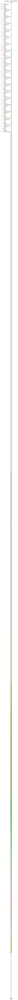

In [75]:
import matplotlib.pyplot as plt

fig,ax = plt.subplots(figsize=(200,200))
data.plot(ax=ax,facecolor='none',linewidth=2, edgecolor='black')

# Getting unique categories
categories = final_merged['category_title'].unique()

# Assigning a color to each category
colors = plt.cm.tab20.colors[:len(categories)]

# Plotting each category
for i, category in enumerate(categories):
    final_merged[final_merged['category_title'] == category].plot(ax=ax, color=colors[i], label=category)

# Adding legend
plt.legend()

# Adding title
plt.title('Category on World Map')

# Displaying the plot
plt.show()


In [34]:
# categories = merged_data['category_title'].unique()
# colors = plt.cm.tab10.colors  # Use colors from a colormap

# fig, ax = plt.subplots(figsize=(10, 10))
# for i, category in enumerate(categories):
#     category_data = merged_data[merged_data['category_title'] == category]
#     country_codes = category_data['coulor_code'].unique()
#     for country_code in country_codes:
#         points = points_per_country[country_code]
#         for point in points:
#             ax.scatter(point.x, point.y, color=colors[i % len(colors)], label=category)

# # Plot country polygons
# data.plot(ax=ax, color='none', edgecolor='black')

# # Add legend
# ax.legend()

# # Show plot
# plt.show()